In [1]:
%matplotlib inline
%reload_ext autoreload

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import seaborn as sns
import logging

FORMAT = "%(asctime)s %(message)s"

logging.basicConfig(level="INFO", format=FORMAT, datefmt="%d-%b-%y %H:%M:%S")
sns.set_context("talk")

In [3]:
epoch_key = 'Jaq', 3, 12

In [4]:
import cupy as cp

mempool = cp.get_default_memory_pool()
pinned_mempool = cp.get_default_pinned_memory_pool()

# You can clear the memory pool by calling `free_all_blocks`.
mempool.free_all_blocks()
pinned_mempool.free_all_blocks()

In [5]:
from src.load_data import load_data


data = load_data(epoch_key,
                 position_to_linearize=['nose_x', 'nose_y'],
                 max_distance_from_well=30,
                 min_distance_traveled=50,
                 )

26-Feb-22 17:26:50 Loading position info...
26-Feb-22 17:27:40 Loading multiunit...
26-Feb-22 17:28:00 Loading spikes...
26-Feb-22 17:28:05 Finding ripple times...


In [6]:
import numpy as np

detector_parameters = {
    'movement_var': 6.0,
    'replay_speed': 1,
    'place_bin_size': 2.0,
    'spike_model_knot_spacing': 12.0,
    'spike_model_penalty': 1E-5,
    'movement_state_transition_type': 'random_walk',
    'multiunit_model_kwargs': {
        'mark_std': 24.0, 'position_std': 4.0, 'block_size': 100},
    'discrete_state_transition_type': 'constant',
    'discrete_diagonal': np.array([0.02, 0.98])
}

In [7]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING


non_local_detector = ReplayDetector(**detector_parameters)
logging.info(non_local_detector)

non_local_detector.fit(
    is_ripple=data['is_ripple'],
    is_training=np.ones_like(data['position_info'].linear_position).squeeze(),
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    multiunit=data['multiunits'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
    use_gpu=True,
)

non_local_results = non_local_detector.predict(
    speed=data['position_info'].nose_vel,
    multiunit=data['multiunits'],
    position=data['position_info'].linear_position,
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['multiunit'],
    use_acausal=True,
    set_no_spike_to_equally_likely=False,
    use_gpu=False
)
logging.info('Done!')

26-Feb-22 17:28:42 ReplayDetector(discrete_diagonal=array([0.02, 0.98]),
               discrete_state_transition_penalty=1e-05,
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_t...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 24.0,
                                       'position_std': 4.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.0, position_range=None, replay_speed=1,
               speed_knots=None, speed_threshold=4.0,
               spike_model_knot_spacing=12.0, spi

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

26-Feb-22 17:35:20 Finding causal non-local probability and position...
26-Feb-22 17:35:28 Finding acausal non-local probability and position...
26-Feb-22 17:35:57 Done!


In [8]:
from replay_trajectory_classification import ClusterlessClassifier
from replay_trajectory_classification.environments import Environment
from replay_trajectory_classification.discrete_state_transitions import DiagonalDiscrete

environment = Environment(
        place_bin_size=2.0,
        track_graph=data['track_graph'],
        edge_order=WTRACK_EDGE_ORDER,
        edge_spacing=WTRACK_EDGE_SPACING)

classifier = ClusterlessClassifier(
    environments=environment,
    discrete_transition_type=DiagonalDiscrete(diagonal_value=0.98),
    clusterless_algorithm='multiunit_likelihood_integer_cupy',
    clusterless_algorithm_params={'mark_std': 24.0,
                                  'position_std': 4.0,
                                 }
)

classifier.fit(
    position=data['position_info'].linear_position,
    multiunits=data['multiunits'],
)

classifier_results = classifier.predict(
    multiunits=data['multiunits'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    state_names=['Continuous', 'Fragmented'],
    use_gpu=True,
)
logging.info('Done!')

26-Feb-22 17:35:58 Fitting initial conditions...
26-Feb-22 17:35:58 Fitting state transition...
26-Feb-22 17:35:58 Fitting multiunits...
26-Feb-22 17:35:59 Estimating likelihood...
26-Feb-22 17:36:14 Estimating causal posterior...
26-Feb-22 17:38:02 Estimating acausal posterior...
26-Feb-22 17:41:55 Done!


In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import copy

from scipy.stats import zscore


def plot_detector(time_ind, data, replay_detector, detector_results,
                  figsize=(11, 6.0)):
    fig, axes = plt.subplots(6, 1,
                             figsize=figsize,
                             sharex=True,
                             constrained_layout=True,
                             gridspec_kw={
                                 'height_ratios': [1, 1, 3, 1, 3, 1]},
                            dpi=100)
    time = data['spikes'].iloc[time_ind].index / np.timedelta64(1, 's')
    
    # axes 0
    # max_consensus = np.ceil(zscore(data['ripple_consensus_trace'], nan_policy='omit').values.max()).astype(int)
    start_time = data['spikes'].iloc[time_ind].index.min()
    end_time = data['spikes'].iloc[time_ind].index.max()
    ripple_consensus_trace = zscore(data['ripple_consensus_trace'], nan_policy='omit').loc[start_time:end_time]
    
    max_consensus = max(int(np.ceil(ripple_consensus_trace.max())), 5)
    min_consensus = min(int(np.ceil(ripple_consensus_trace.min())), -1)
    ripple_consensus_trace_time = ripple_consensus_trace.index / np.timedelta64(1, 's')
    
    axes[0].fill_between(
        time, np.ones_like(time) * max_consensus,
        where=data['ripple_labels'].iloc[time_ind].values.squeeze() > 0,
        color='red', zorder=-2, alpha=0.6, step='pre')
    axes[0].fill_between(
        ripple_consensus_trace_time,
        ripple_consensus_trace.values.squeeze(), color='black')
    axes[0].set_ylim((min_consensus, max_consensus))
    axes[0].set_yticks((min_consensus, max_consensus))
    axes[0].set_ylabel("Ripple\nStd.")
    
    # axes 1
    multiunit_firing = (
        data["multiunit_firing_rate"]
        .reset_index(drop=True)
        .set_index(
            data["multiunit_firing_rate"].index / np.timedelta64(1, "s"))
    )
    max_multiunit = np.ceil(data["multiunit_firing_rate"].values.max()).astype(int)
    axes[1].fill_between(
        multiunit_firing.iloc[time_ind].index.values,
        multiunit_firing.iloc[time_ind].values.squeeze(),
        color="black",
    )
    axes[1].fill_between(
        time, np.ones_like(time) * max_multiunit,
        where=data["multiunit_high_synchrony_labels"].iloc[time_ind].values.squeeze() > 0,
        color='blue', zorder=-2, alpha=0.6, step='pre')
    axes[1].set_ylim((0, max_multiunit))
    axes[1].set_yticks((0, max_multiunit))
    axes[1].set_ylabel("Multiunit\nRate\n[spikes / s]")

    # axes 2
    try:
        place_fields = (
            replay_detector._spiking_likelihood
            .keywords['place_conditional_intensity']).squeeze()
        n_neurons = place_fields.shape[1]
        place_field_max = np.nanargmax(place_fields, axis=0)
        linear_position_order = place_field_max.argsort(axis=0).squeeze()
        spike_time_ind, neuron_ind = np.nonzero(
            np.asarray(data['spikes'].iloc[time_ind])[:, linear_position_order])
        axes[2].set_ylabel('Cells')
    except AttributeError:
        spike_time_ind, neuron_ind = np.nonzero(np.any(~np.isnan(
            data['multiunits'].isel(time=time_ind)), axis=1).values)
        n_neurons = data['multiunits'].shape[-1]
        axes[2].set_ylabel('Tetrodes')

    axes[2].scatter(time[spike_time_ind], neuron_ind,
                    clip_on=False, s=10, color='black', marker='|', rasterized=True)
    axes[2].set_ylim((0, n_neurons))
    axes[2].set_yticks((0, n_neurons))
    axes[2].fill_between(
        time, np.ones_like(time) * n_neurons,
        where=detector_results.isel(time=time_ind).non_local_probability >= 0.80,
        color='green', zorder=-1, alpha=0.6, step='pre')
    
    # axes 3
    detector_results.isel(time=time_ind).non_local_probability.plot(
        x='time', ax=axes[3], color='black', clip_on=False)
    axes[3].set_ylabel('Prob.')
    axes[3].set_xlabel("")
    axes[3].set_ylim((0, 1))

    cmap = copy.copy(plt.get_cmap('bone_r'))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    # axes 4
    (detector_results
     .isel(time=time_ind)
     .acausal_posterior
     .sum('state')
     .where(replay_detector.is_track_interior_)
     .plot(x='time', y='position', ax=axes[4], cmap=cmap,
           vmin=0.0, vmax=0.05))
    axes[4].scatter(data['position_info'].iloc[time_ind].index /
                    np.timedelta64(1, 's'),
                    data['position_info'].iloc[time_ind].linear_position,
                    s=1,
                    color='magenta', clip_on=False)
    axes[4].set_xlabel("")
    max_position = np.ceil(data['position_info'].linear_position.max()).astype(int)
    axes[4].set_yticks((0.0, max_position))
    axes[4].set_ylim((0.0, max_position))
    axes[4].set_ylabel('Position [cm]')
    
    # axes 5
    speed = np.asarray(data['position_info'].iloc[time_ind].nose_vel).squeeze()
    max_speed = np.ceil(speed.max()).astype(int)
    max_speed = max(5, max_speed)
    axes[5].fill_between(time, speed, color='grey')
    axes[5].axhline(4, color='black', linestyle='--', linewidth=1)
    axes[5].set_ylabel('Speed\n[cm / s]')
    axes[5].set_yticks((0.0, max_speed))
    axes[5].set_ylim((0.0, max_speed))
    
    axes[-1].set_xlabel('Time [s]')
    axes[-1].xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    sns.despine(offset=5)
    
    
def plot_classifier(time_ind, data, classifier, results,
                    figsize=(11, 6.0)):
    fig, axes = plt.subplots(6, 1,
                             figsize=figsize,
                             sharex=True,
                             constrained_layout=True,
                             gridspec_kw={
                                 'height_ratios': [1, 1, 3, 1, 3, 1]},
                            dpi=100)
    time = data['spikes'].iloc[time_ind].index / np.timedelta64(1, 's')
    
    # axes 0
    start_time = data['spikes'].iloc[time_ind].index.min()
    end_time = data['spikes'].iloc[time_ind].index.max()
    ripple_consensus_trace = zscore(data['ripple_consensus_trace'], nan_policy='omit').loc[start_time:end_time]
    
    max_consensus = max(int(np.ceil(ripple_consensus_trace.max())), 5)
    min_consensus = min(int(np.ceil(ripple_consensus_trace.min())), -1)
    ripple_consensus_trace_time = ripple_consensus_trace.index / np.timedelta64(1, 's')
    
    axes[0].fill_between(
        time, np.ones_like(time) * max_consensus,
        where=data['ripple_labels'].iloc[time_ind].values.squeeze() > 0,
        color='red', zorder=-2, alpha=0.6, step='pre')
    axes[0].fill_between(
        ripple_consensus_trace_time,
        ripple_consensus_trace.values.squeeze(), color='black')
    axes[0].set_ylim((min_consensus, max_consensus))
    axes[0].set_yticks((min_consensus, max_consensus))
    axes[0].set_ylabel("Ripple\nStd.")
    
    # axes 1
    multiunit_firing = (
        data["multiunit_firing_rate"]
        .reset_index(drop=True)
        .set_index(
            data["multiunit_firing_rate"].index / np.timedelta64(1, "s"))
    )
    max_multiunit = np.ceil(data["multiunit_firing_rate"].values.max()).astype(int)
    axes[1].fill_between(
        multiunit_firing.iloc[time_ind].index.values,
        multiunit_firing.iloc[time_ind].values.squeeze(),
        color="black",
    )
    axes[1].fill_between(
        time, np.ones_like(time) * max_multiunit,
        where=data["multiunit_high_synchrony_labels"].iloc[time_ind].values.squeeze() > 0,
        color='blue', zorder=-2, alpha=0.6, step='pre')
    axes[1].set_ylim((0, max_multiunit))
    axes[1].set_yticks((0, max_multiunit))
    axes[1].set_ylabel("Multiunit\nRate\n[spikes / s]")

    # axes 2
    try:
        place_fields = (
            classifier._spiking_likelihood
            .keywords['place_conditional_intensity']).squeeze()
        n_neurons = place_fields.shape[1]
        place_field_max = np.nanargmax(place_fields, axis=0)
        linear_position_order = place_field_max.argsort(axis=0).squeeze()
        spike_time_ind, neuron_ind = np.nonzero(
            np.asarray(data['spikes'].iloc[time_ind])[:, linear_position_order])
        axes[2].set_ylabel('Cells')
    except AttributeError:
        spike_time_ind, neuron_ind = np.nonzero(np.any(~np.isnan(
            data['multiunits'].isel(time=time_ind)), axis=1).values)
        n_neurons = data['multiunits'].shape[-1]
        axes[2].set_ylabel('Tetrodes')

    axes[2].scatter(time[spike_time_ind], neuron_ind,
                    clip_on=False, s=10, color='black', marker='|', rasterized=True)
    axes[2].set_ylim((0, n_neurons))
    axes[2].set_yticks((0, n_neurons))
    
    # axes 3
    results.isel(time=time_ind).acausal_posterior.sum('position').plot(
        x='time', ax=axes[3], hue='state', clip_on=False, add_legend=False)
    axes[3].set_ylabel('Prob.')
    axes[3].set_xlabel("")
    axes[3].set_ylim((0, 1))

    cmap = copy.copy(plt.get_cmap('bone_r'))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    # axes 4
    (results
     .isel(time=time_ind)
     .acausal_posterior
     .sum('state')
     .where(classifier.environments[0].is_track_interior_)
     .plot(x='time', y='position', ax=axes[4], cmap=cmap,
           vmin=0.0, vmax=0.05))
    axes[4].scatter(data['position_info'].iloc[time_ind].index /
                    np.timedelta64(1, 's'),
                    data['position_info'].iloc[time_ind].linear_position,
                    s=1,
                    color='magenta', clip_on=False)
    axes[4].set_xlabel("")
    max_position = np.ceil(data['position_info'].linear_position.max()).astype(int)
    axes[4].set_yticks((0.0, max_position))
    axes[4].set_ylim((0.0, max_position))
    axes[4].set_ylabel('Position [cm]')
    
    # axes 5
    speed = np.asarray(data['position_info'].iloc[time_ind].nose_vel).squeeze()
    max_speed = np.ceil(speed.max()).astype(int)
    max_speed = max(5, max_speed)
    axes[5].fill_between(time, speed, color='grey')
    axes[5].axhline(4, color='black', linestyle='--', linewidth=1)
    axes[5].set_ylabel('Speed\n[cm / s]')
    axes[5].set_yticks((0.0, max_speed))
    axes[5].set_ylim((0.0, max_speed))
    
    axes[-1].set_xlabel('Time [s]')
    axes[-1].xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    sns.despine(offset=5)

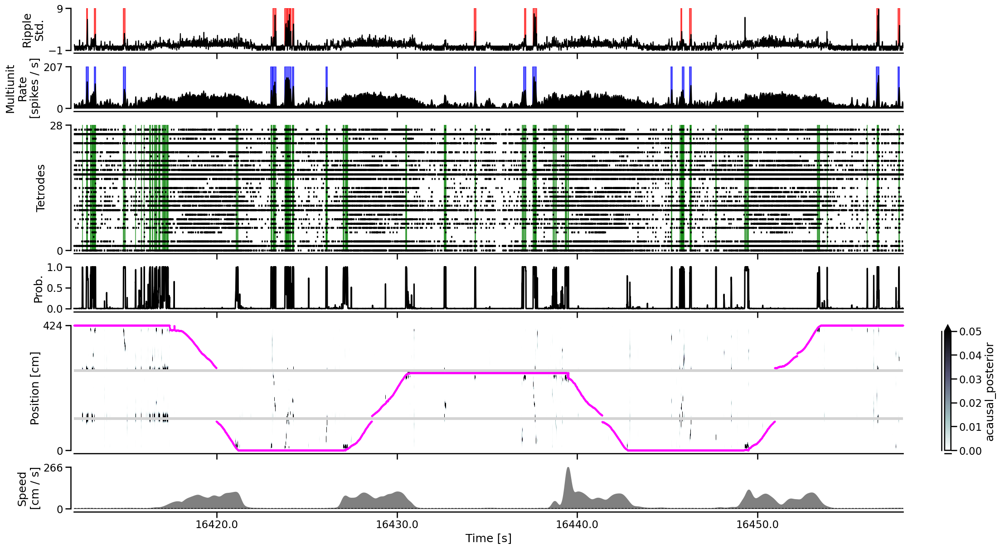

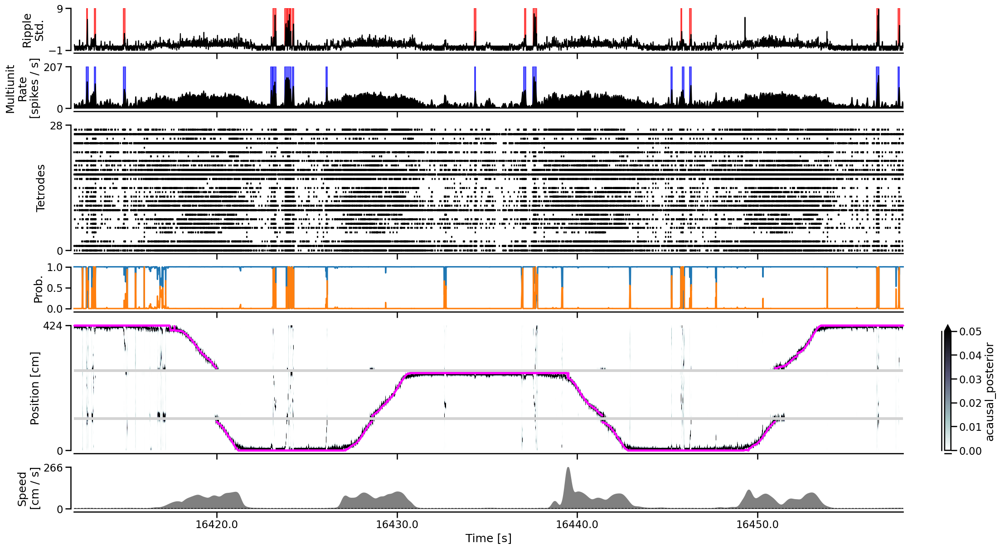

In [10]:
time_slice = slice(22_000, 45_000)
plot_detector(time_slice, data, non_local_detector, non_local_results, figsize=(22, 12.0))
plot_classifier(time_slice, data, classifier, classifier_results, figsize=(22, 12.0))

In [11]:
list(non_local_detector._multiunit_likelihood.keywords.keys())

['place_bin_centers',
 'encoding_marks',
 'encoding_marks_position',
 'encoding_weights',
 'encoding_position',
 'summed_ground_process_intensity',
 'occupancy',
 'mean_rates',
 'mark_std',
 'position_std',
 'is_track_interior',
 'is_training',
 'block_size']

In [13]:
from replay_identification.multiunit_likelihood_integer_gpu import estimate_non_local_multiunit_likelihood, scale_likelihood

non_local_multiunit_likelihood = estimate_non_local_multiunit_likelihood(
    data['multiunits'].values,
    encoding_marks=non_local_detector._multiunit_likelihood.keywords['encoding_marks'],
    encoding_weights=non_local_detector._multiunit_likelihood.keywords['encoding_weights'],
    mark_std=non_local_detector._multiunit_likelihood.keywords['mark_std'],
    place_bin_centers=non_local_detector._multiunit_likelihood.keywords['place_bin_centers'],
    encoding_positions=non_local_detector._multiunit_likelihood.keywords['encoding_marks_position'],
    position_std=non_local_detector._multiunit_likelihood.keywords['position_std'],
    occupancy=non_local_detector._multiunit_likelihood.keywords['occupancy'],
    mean_rates=non_local_detector._multiunit_likelihood.keywords['mean_rates'],
    summed_ground_process_intensity=non_local_detector._multiunit_likelihood.keywords['summed_ground_process_intensity'],
    max_mark_value=6000,
    is_track_interior=non_local_detector._multiunit_likelihood.keywords['is_track_interior'],
    block_size=non_local_detector._multiunit_likelihood.keywords['block_size'],
    disable_progress_bar=False,
)

n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

In [14]:
scaled_non_local_multiunit_likelihood = scale_likelihood(non_local_multiunit_likelihood[:, np.newaxis, :]).squeeze()

In [15]:
from replay_identification.multiunit_likelihood_integer_gpu import estimate_local_multiunit_likelihood

local_multiunit_likelihood = estimate_local_multiunit_likelihood(
    data['multiunits'].values,
    np.asarray(data['position_info'].linear_position)[:, np.newaxis],
    encoding_marks=non_local_detector._multiunit_likelihood.keywords['encoding_marks'],
    encoding_weights=non_local_detector._multiunit_likelihood.keywords['encoding_weights'],
    mark_std=non_local_detector._multiunit_likelihood.keywords['mark_std'],
    encoding_position=non_local_detector._multiunit_likelihood.keywords['encoding_position'],
    encoding_marks_position=non_local_detector._multiunit_likelihood.keywords['encoding_marks_position'],
    position_std=non_local_detector._multiunit_likelihood.keywords['position_std'],
    mean_rates=non_local_detector._multiunit_likelihood.keywords['mean_rates'],
    max_mark_value=6000,
    set_diag_zero=False,
    time_bin_size=1,
    block_size=non_local_detector._multiunit_likelihood.keywords['block_size'],
    is_training=non_local_detector._multiunit_likelihood.keywords['is_training'],
    disable_progress_bar=False,
)

# local_multiunit_likelihood = estimate_local_multiunit_likelihood(
#         non_local_detector._multiunit_likelihood.keywords['place_bin_centers'],
#         non_local_multiunit_likelihood,
#         np.asarray(data['position_info'].linear_position)[:, np.newaxis])


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

In [16]:
local_multiunit_likelihood.shape

(448713,)

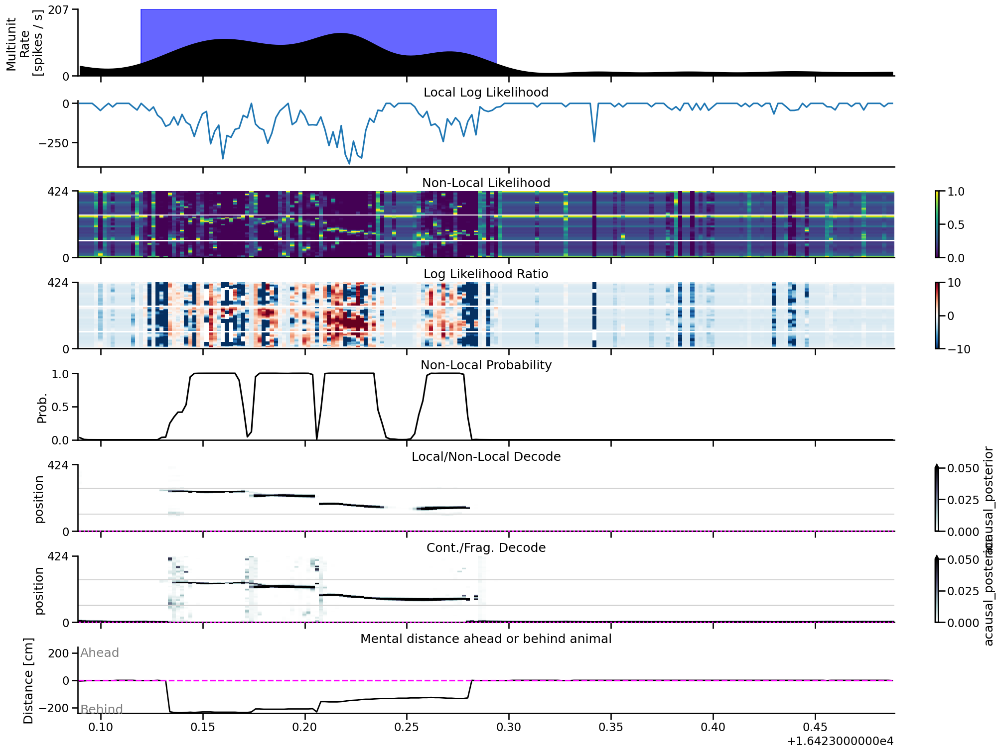

In [18]:
from trajectory_analysis_tools import get_trajectory_data, get_ahead_behind_distance


def plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 8.0),
):
    
    time = non_local_results.isel(time=time_slice).time.values
    t, p = np.meshgrid(non_local_results.isel(time=time_slice).time.values, non_local_results.position.values)
    max_position = np.ceil(data['position_info'].linear_position.max()).astype(int)

    fig, axes = plt.subplots(8, 1, figsize=figsize, dpi=100, constrained_layout=True, sharex=True, sharey=False)
    
    # axes 0
    multiunit_firing = (
        data["multiunit_firing_rate"]
        .reset_index(drop=True)
        .set_index(
            data["multiunit_firing_rate"].index / np.timedelta64(1, "s"))
    )
    max_multiunit = np.ceil(data["multiunit_firing_rate"].values.max()).astype(int)
    axes[0].fill_between(
        time,
        multiunit_firing.iloc[time_slice].values.squeeze(),
        color="black",
    )
    axes[0].fill_between(
        time, np.ones_like(time) * max_multiunit,
        where=data["multiunit_high_synchrony_labels"].iloc[time_slice].values.squeeze() > 0,
        color='blue', zorder=-2, alpha=0.6, step='pre')
    axes[0].set_ylim((0, max_multiunit))
    axes[0].set_yticks((0, max_multiunit))
    axes[0].set_ylabel("Multiunit\nRate\n[spikes / s]")
    
    # ax 1
    axes[1].plot(time, local_multiunit_likelihood[time_slice])
    axes[1].set_title('Local Log Likelihood')
    axes[1].set_xlabel('')

    # ax 2
    cmap1 = axes[2].pcolormesh(t, p, scaled_non_local_multiunit_likelihood[time_slice].T, vmax=1.0)
    axes[2].set_yticks((0.0, max_position))
    axes[2].set_ylim((0.0, max_position))
    axes[2].set_title('Non-Local Likelihood')

    plt.colorbar(cmap1, ax=axes[2])
    
    # ax 3
    likelihood_ratio = non_local_multiunit_likelihood[time_slice] - local_multiunit_likelihood[time_slice][:, np.newaxis]
    cmap2 = axes[3].pcolormesh(t, p, likelihood_ratio.T,
                               cmap='RdBu_r', vmin=-10, vmax=10)
    axes[3].set_title('Log Likelihood Ratio')
    axes[3].set_yticks((0.0, max_position))
    axes[3].set_ylim((0.0, max_position))
    plt.colorbar(cmap2, ax=axes[3])

    # axes 4
    non_local_results.isel(time=time_slice).non_local_probability.plot(
        x='time', ax=axes[4], color='black', clip_on=False)
    axes[4].set_ylabel('Prob.')
    axes[4].set_xlabel("")
    axes[4].set_ylim((0, 1))
    axes[4].set_title('Non-Local Probability')

    cmap = copy.copy(plt.get_cmap('bone_r'))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    # axes 5
    (non_local_results
     .isel(time=time_slice)
     .acausal_posterior
     .sum('state')
     .where(classifier.environments[0].is_track_interior_)
     .plot(x='time', y='position', ax=axes[5], cmap=cmap,
           vmin=0.0, vmax=0.05))
    axes[5].scatter(time,
                    data['position_info'].iloc[time_slice].linear_position,
                    s=1,
                    color='magenta', clip_on=False, zorder=10)
    axes[5].set_xlabel("")
    axes[5].set_yticks((0.0, max_position))
    axes[5].set_ylim((0.0, max_position))
    axes[5].set_title('Local/Non-Local Decode')
    
    # axes 6
    (classifier_results
     .isel(time=time_slice)
     .acausal_posterior
     .sum('state')
     .where(classifier.environments[0].is_track_interior_)
     .plot(x='time', y='position', ax=axes[6], cmap=cmap,
           vmin=0.0, vmax=0.05))
    axes[6].scatter(time,
                    data['position_info'].iloc[time_slice].linear_position,
                    s=1,
                    color='magenta', clip_on=False, zorder=10)
    axes[6].set_xlabel("")
    axes[6].set_yticks((0.0, max_position))
    axes[6].set_ylim((0.0, max_position))
    axes[6].set_title('Cont./Frag. Decode')


#     trajectory_data = get_trajectory_data(
#         posterior=classifier_results.isel(time=time_slice).sum('state').acausal_posterior,
#         track_graph=data['track_graph'],
#         decoder=classifier,
#         position_info=data['position_info'].iloc[time_slice],
#         direction_variable='body_dir',
#         environment_name=''
#     )
    trajectory_data = get_trajectory_data(
        posterior=classifier_results.isel(time=time_slice).sum('state').acausal_posterior,
        track_graph=data['track_graph'],
        decoder=classifier,
        actual_projected_position=data['position_info'].iloc[time_slice][['projected_x_position', 'projected_y_position']],
        track_segment_id=data['position_info'].iloc[time_slice].track_segment_id,
        actual_orientation=data['position_info'].iloc[time_slice].body_dir,
        environment_name='',
    )
    
    ahead_behind_distance = get_ahead_behind_distance(
        data['track_graph'], *trajectory_data)
    
    axes[7].plot(time,
             ahead_behind_distance,
             color="black", linewidth=2)
    axes[7].axhline(0, color="magenta", linestyle="--")
    axes[7].set_title("Mental distance ahead or behind animal")
    axes[7].set_ylabel("Distance [cm]")
    max_dist = np.max(np.abs(ahead_behind_distance)) + 5
    axes[7].set_ylim((-max_dist, max_dist))
    axes[7].text(time[0], max_dist - 1, "Ahead", color="grey", va='top')
    axes[7].text(time[0], -max_dist + 1, "Behind", color="grey")
    
    axes[-1].xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    
    sns.despine()
    
    
    
    
time_slice = slice(27_500, 27_700)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 15),
)

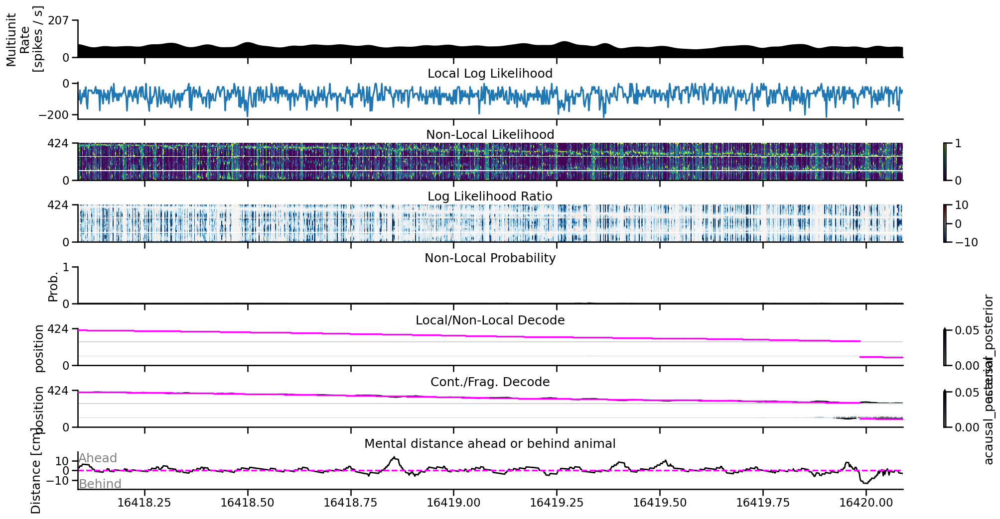

In [19]:
time_slice = slice(25_000, 26_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 10),
)

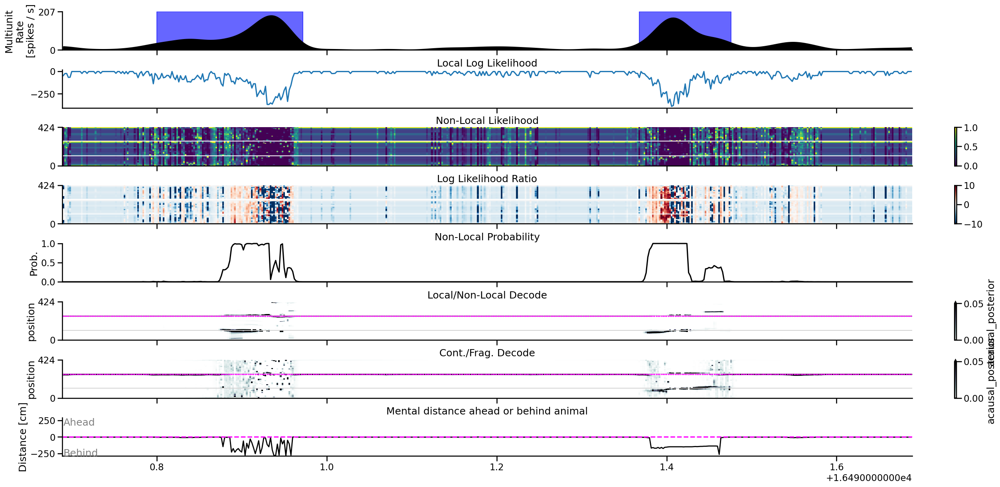

In [20]:
time_slice = slice(61_300, 61_800)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(25, 12),
)

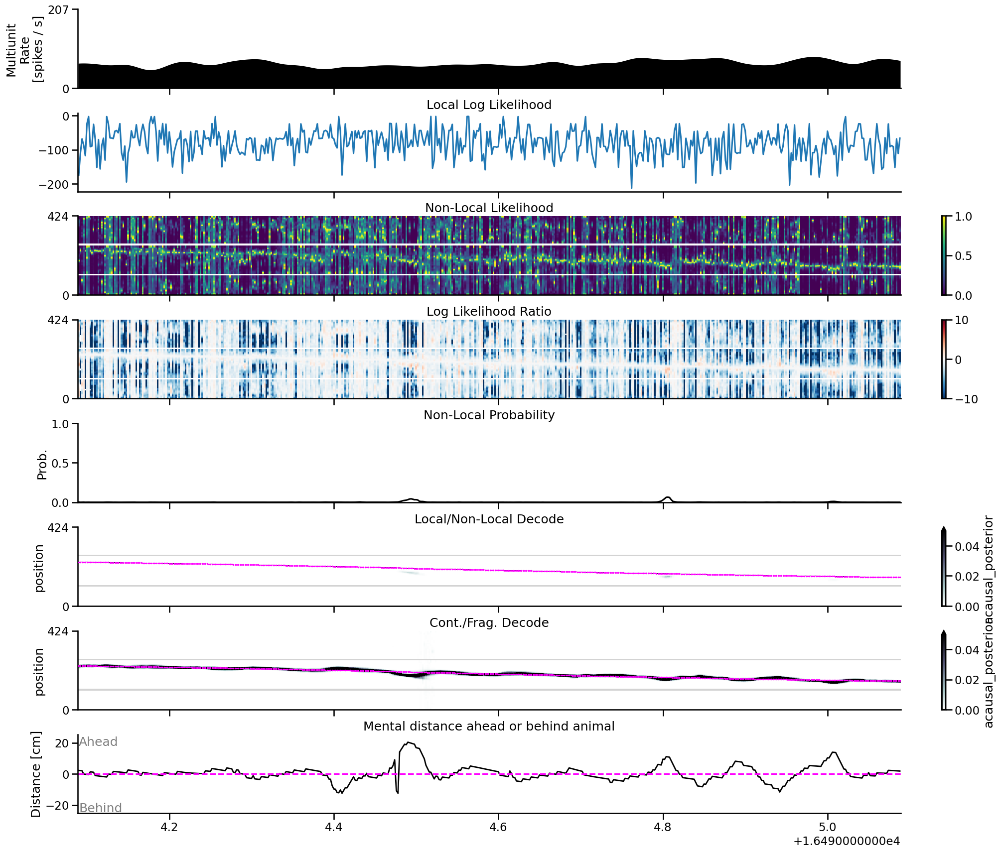

In [21]:
time_slice = slice(63_000, 63_500)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

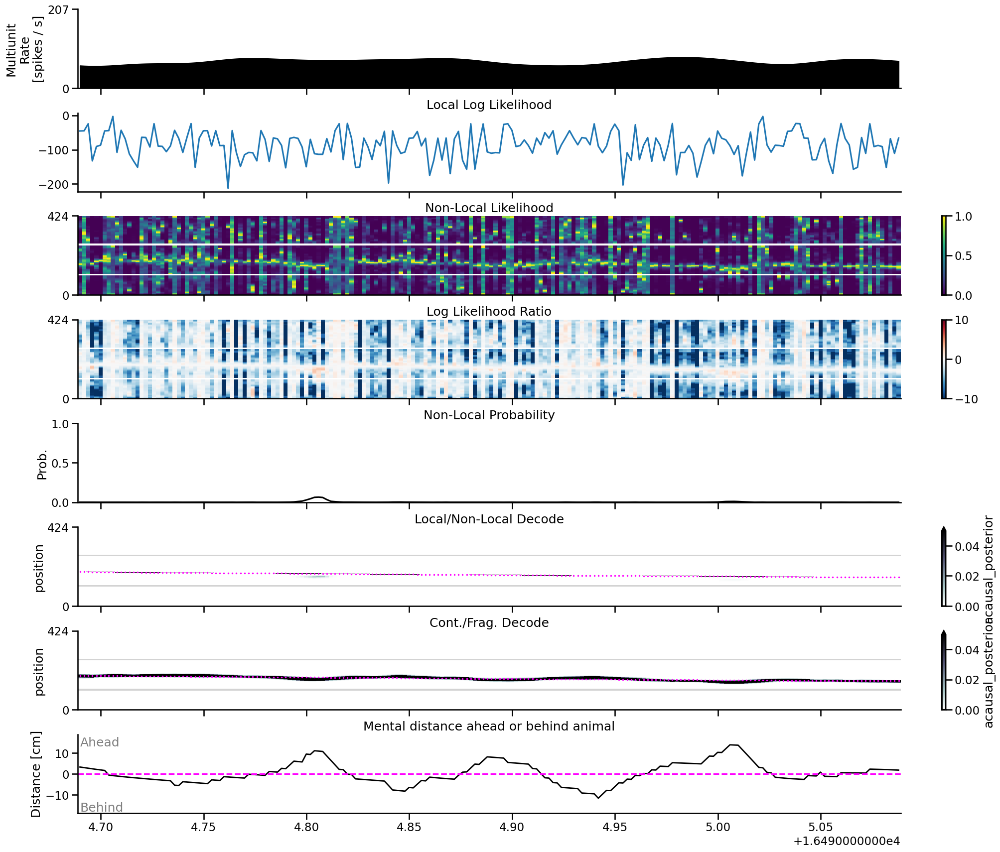

In [22]:
time_slice = slice(63_300, 63_500)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

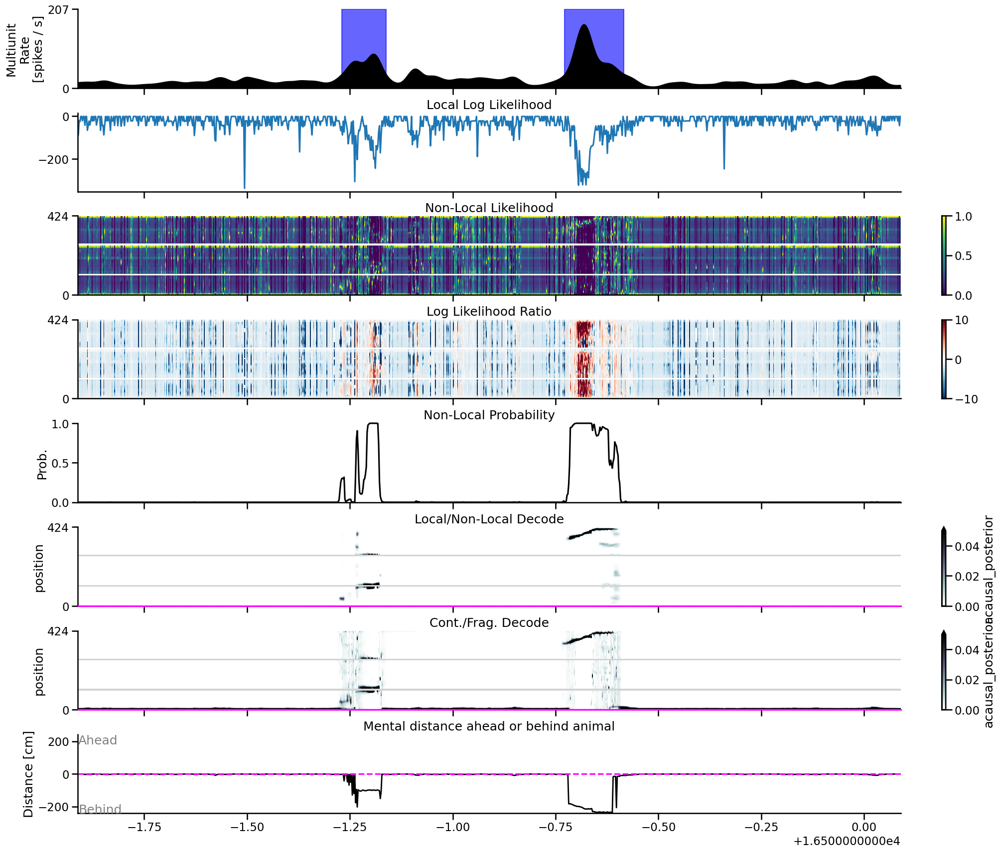

In [23]:
time_slice = slice(65_000, 66_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

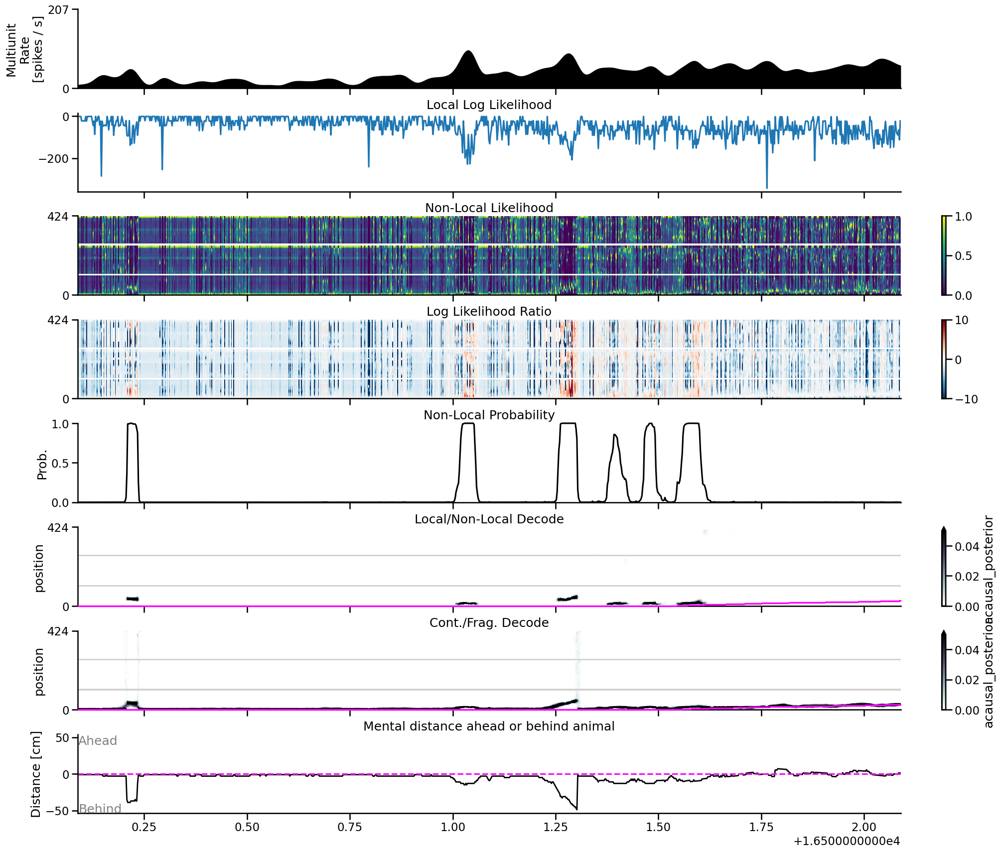

In [24]:
time_slice = slice(66_000, 67_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

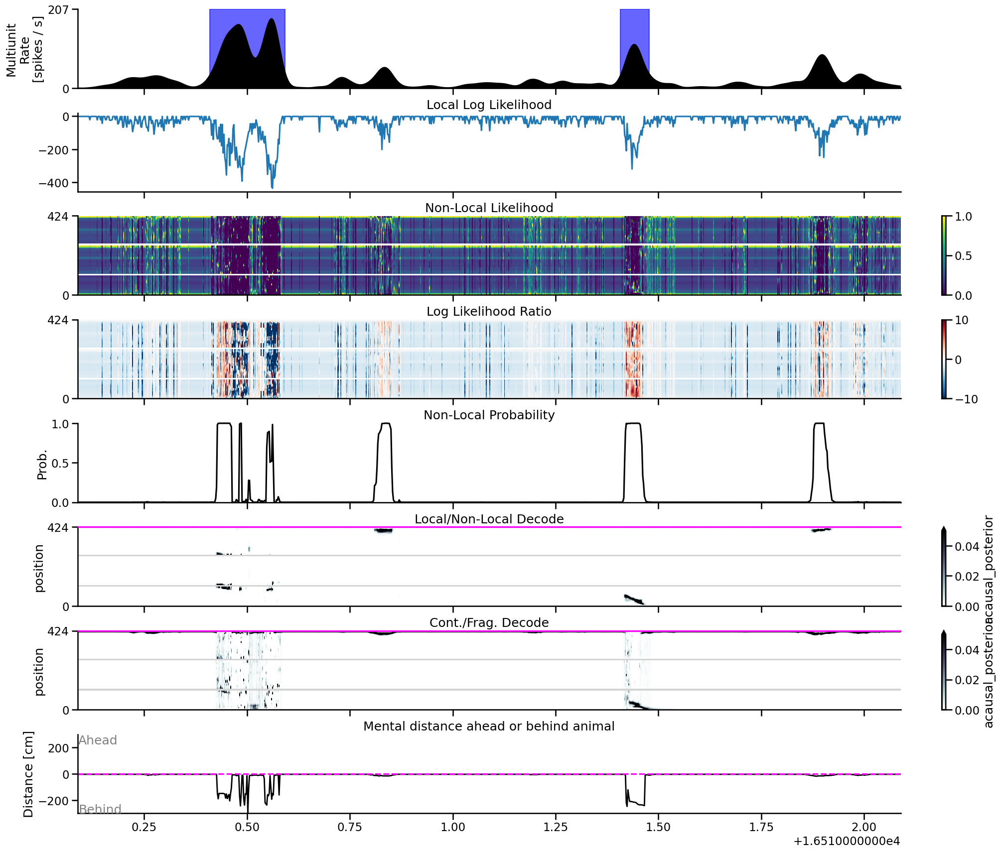

In [25]:
time_slice = slice(71_000, 72_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

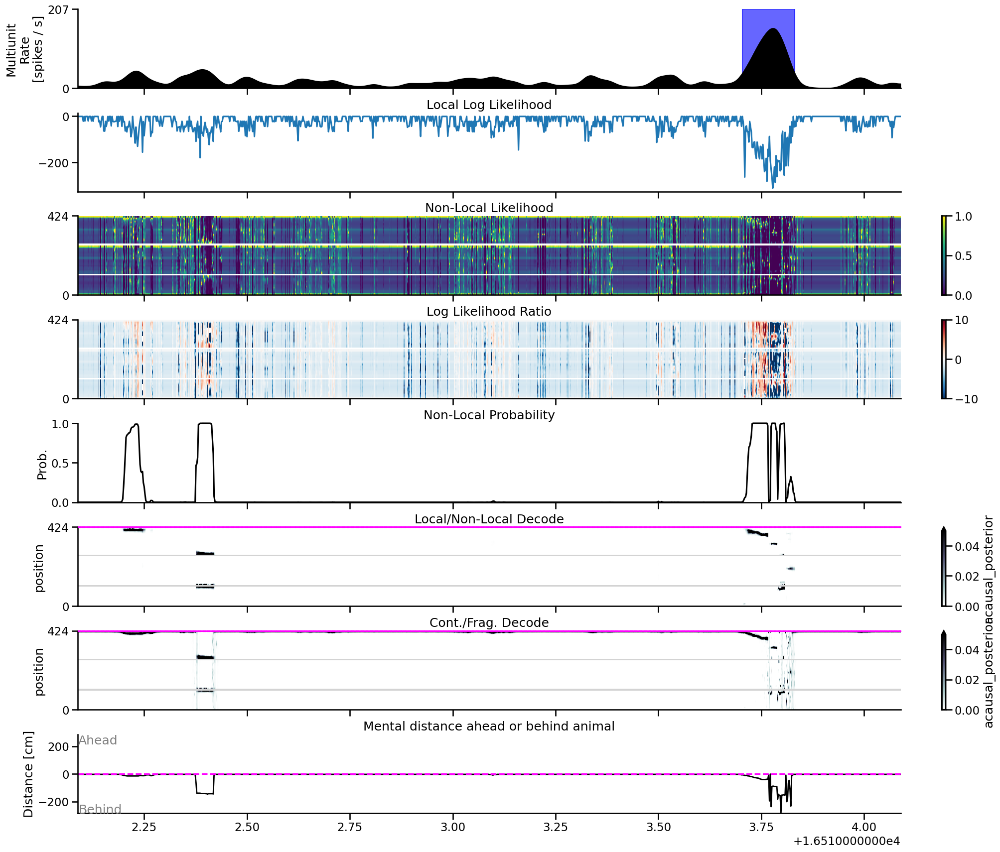

In [26]:
time_slice = slice(72_000, 73_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

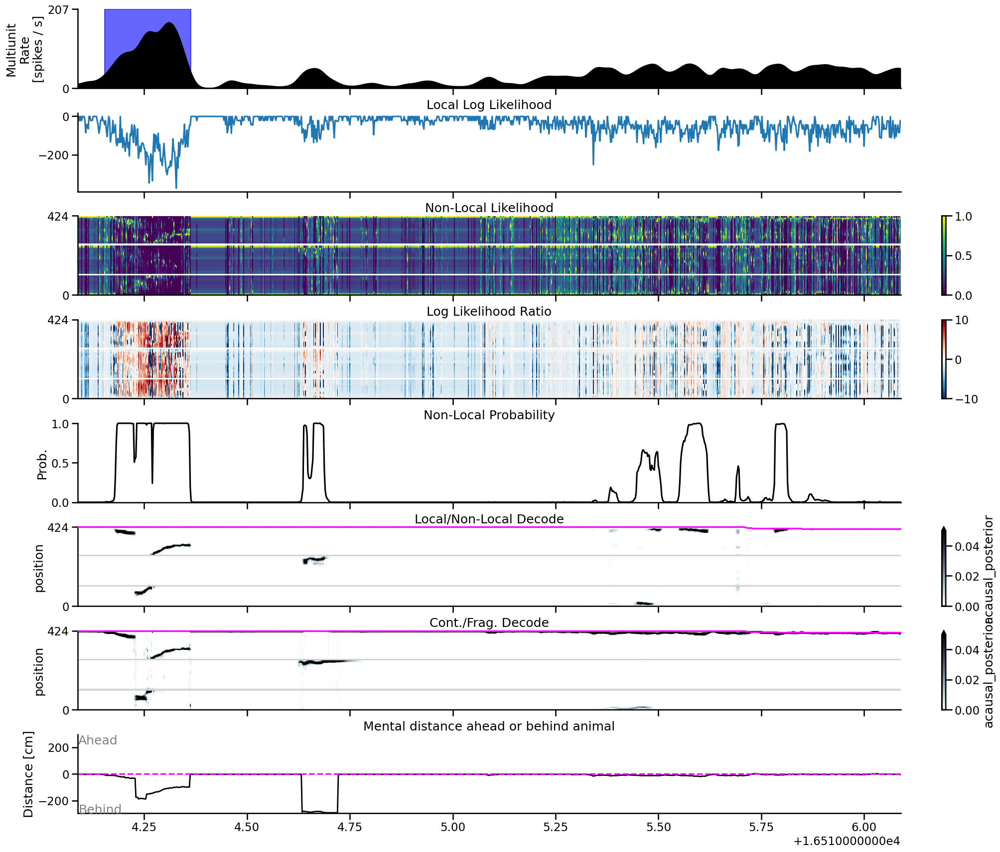

In [27]:
time_slice = slice(73_000, 74_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

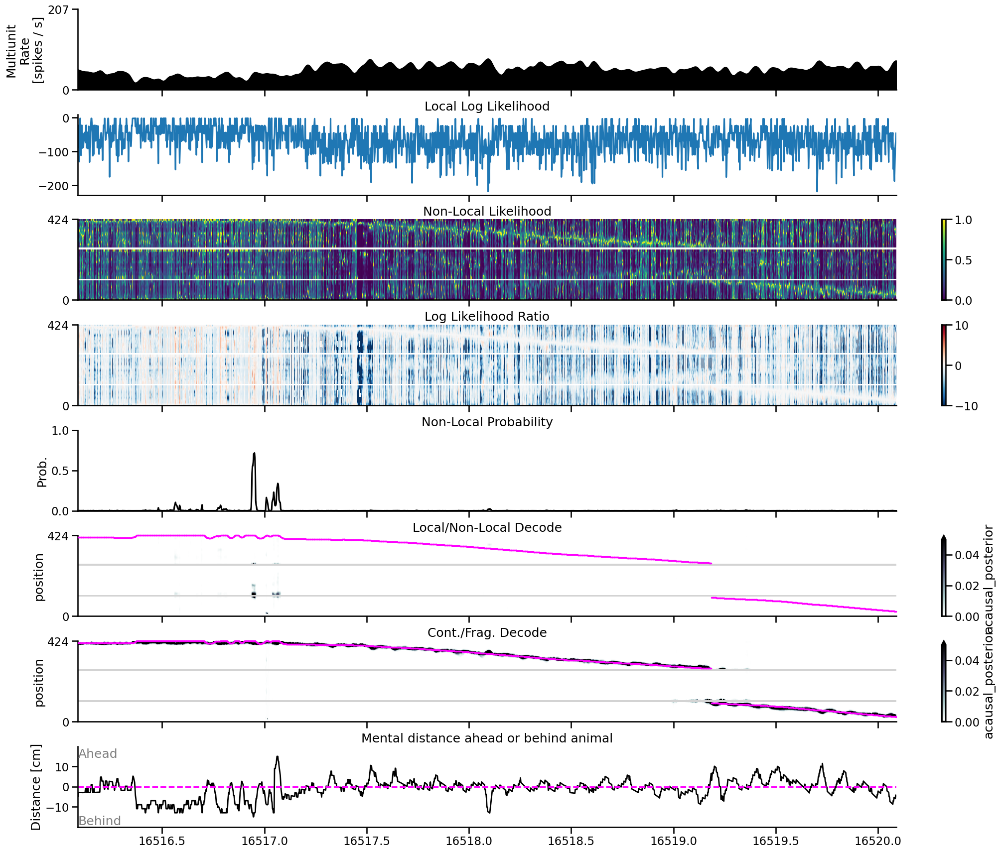

In [28]:
time_slice = slice(74_000, 76_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

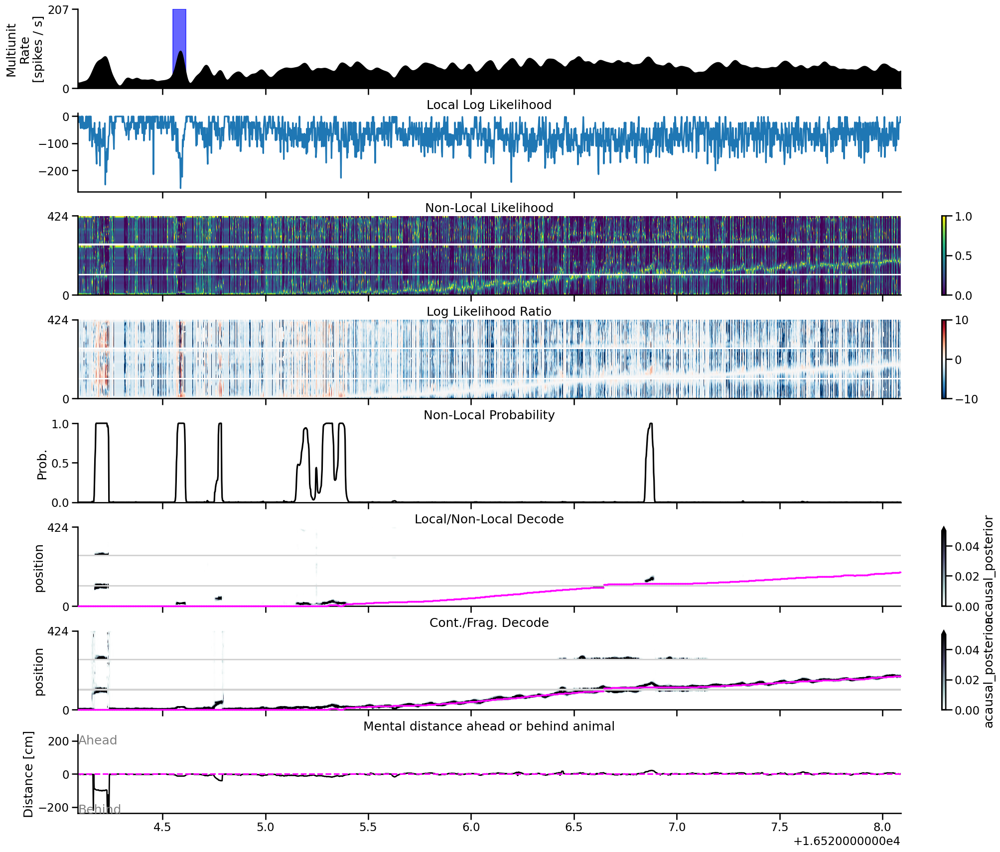

In [29]:
time_slice = slice(78_000, 80_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

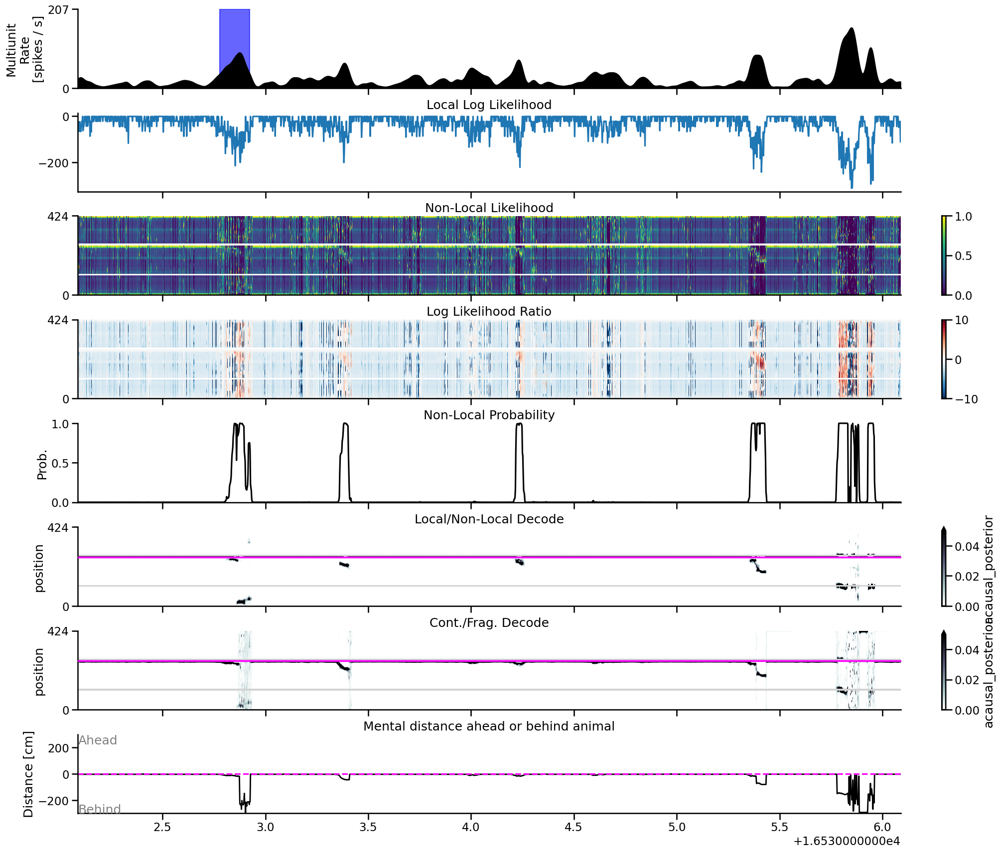

In [30]:
time_slice = slice(82_000, 84_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

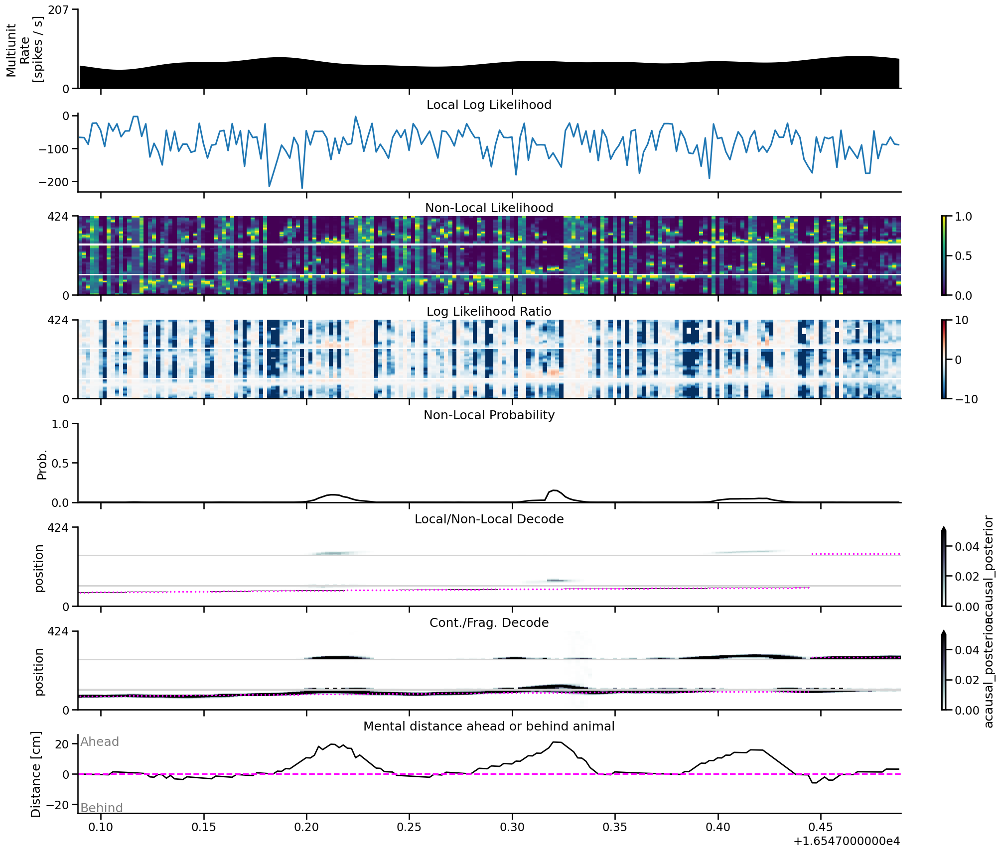

In [31]:
time_slice = slice(89_500, 89_700)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

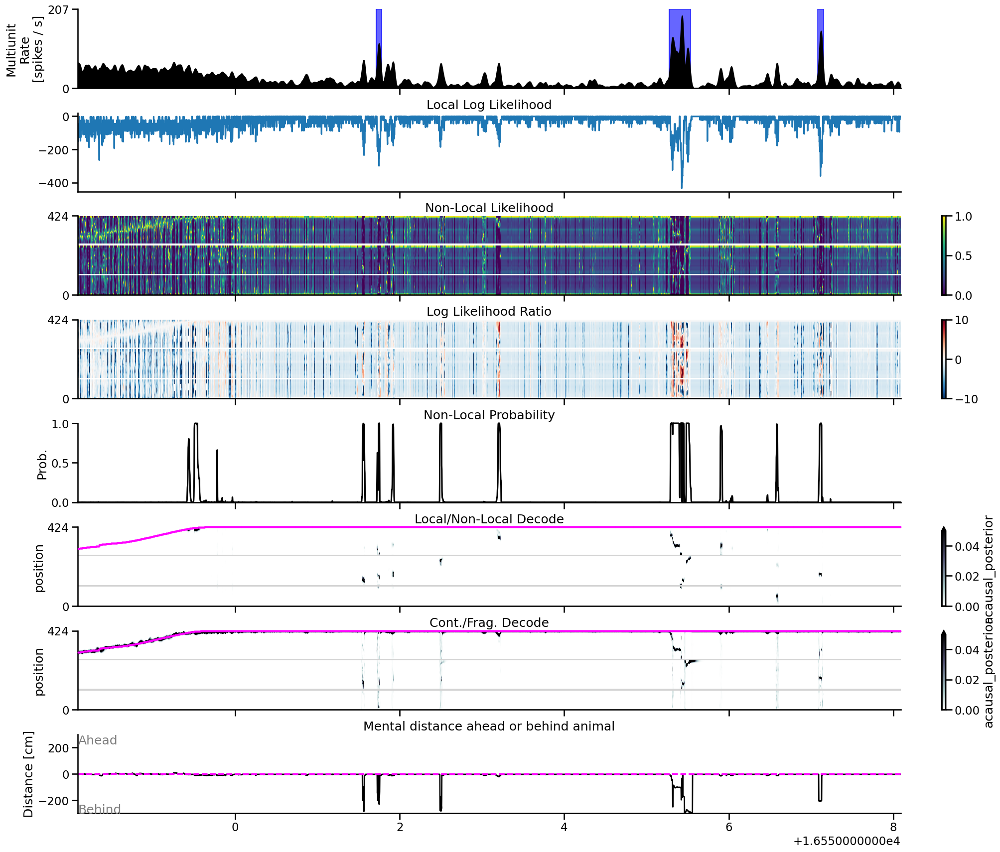

In [35]:
time_slice = slice(90_000, 95_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 17),
)

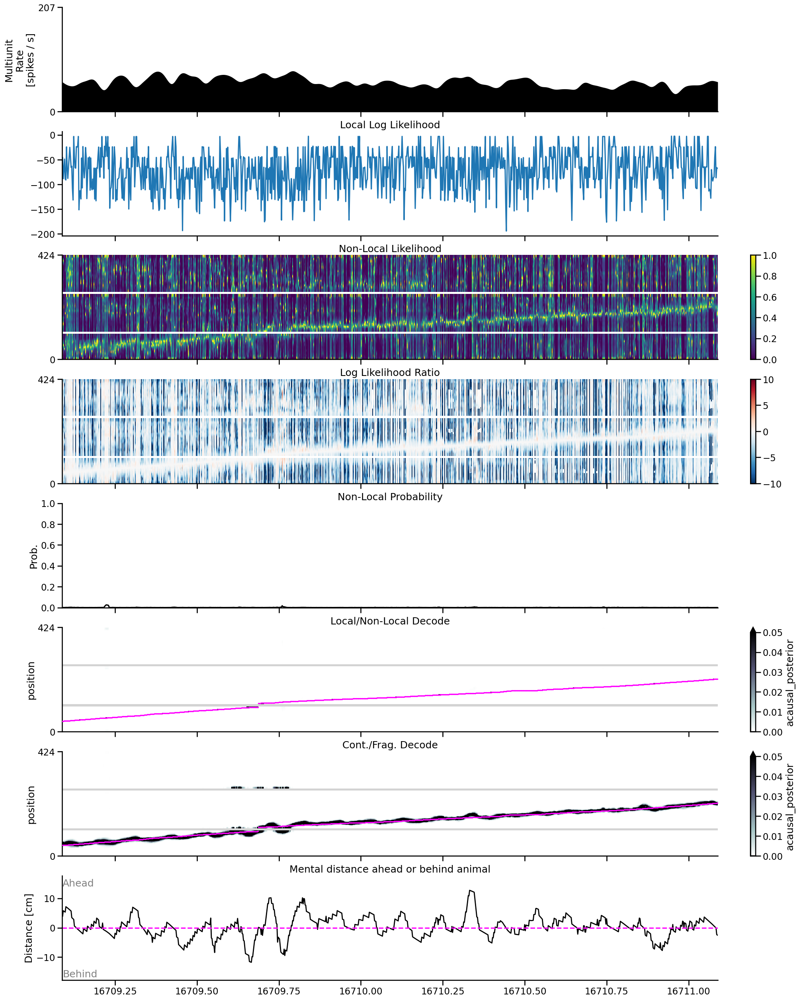

In [37]:
time_slice = slice(170_500, 171_500)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 25),
)

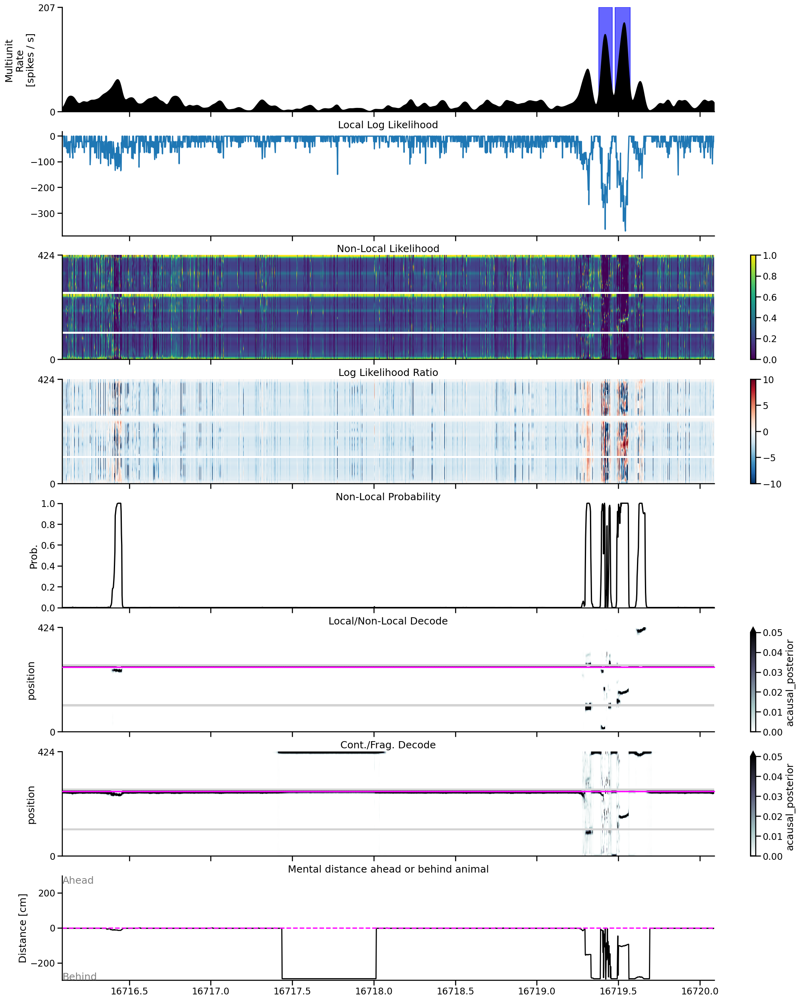

In [38]:
time_slice = slice(174_000, 176_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 25),
)

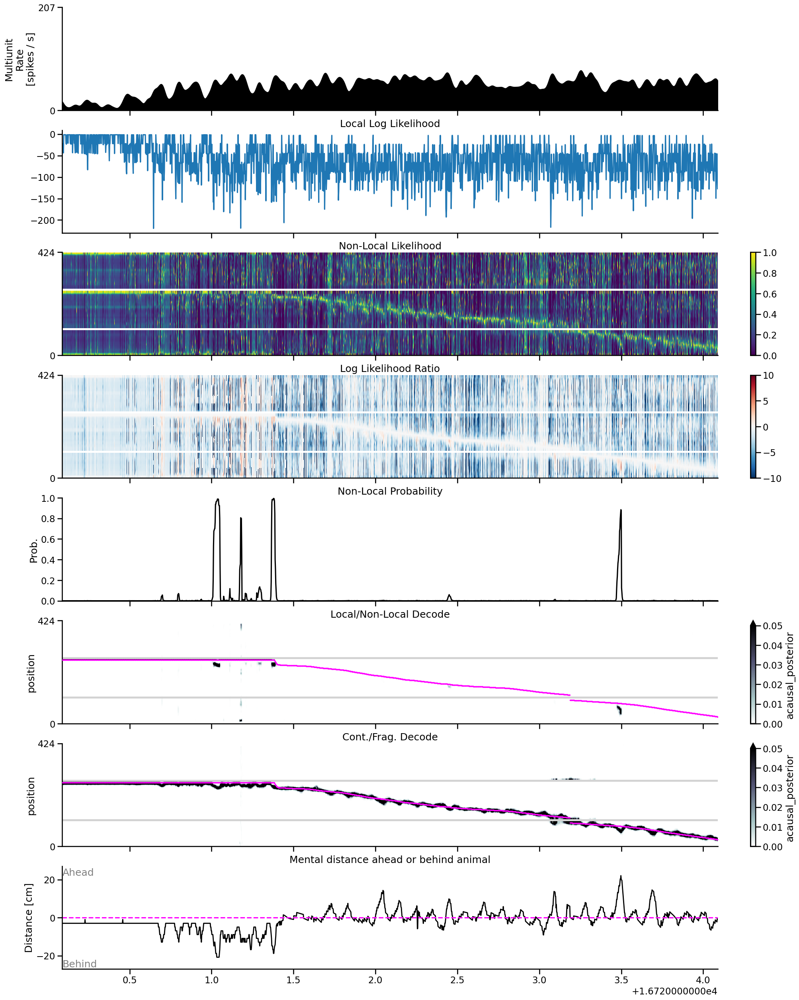

In [39]:
time_slice = slice(176_000, 178_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 25),
)

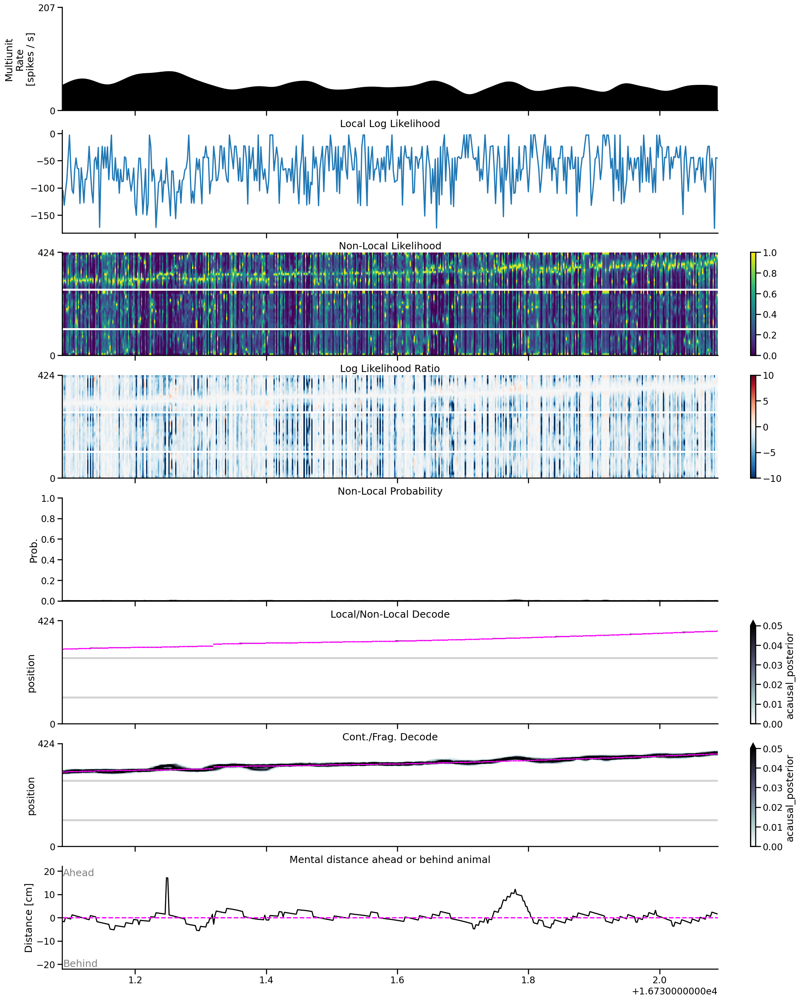

In [40]:
time_slice = slice(181_500, 182_000)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 25),
)

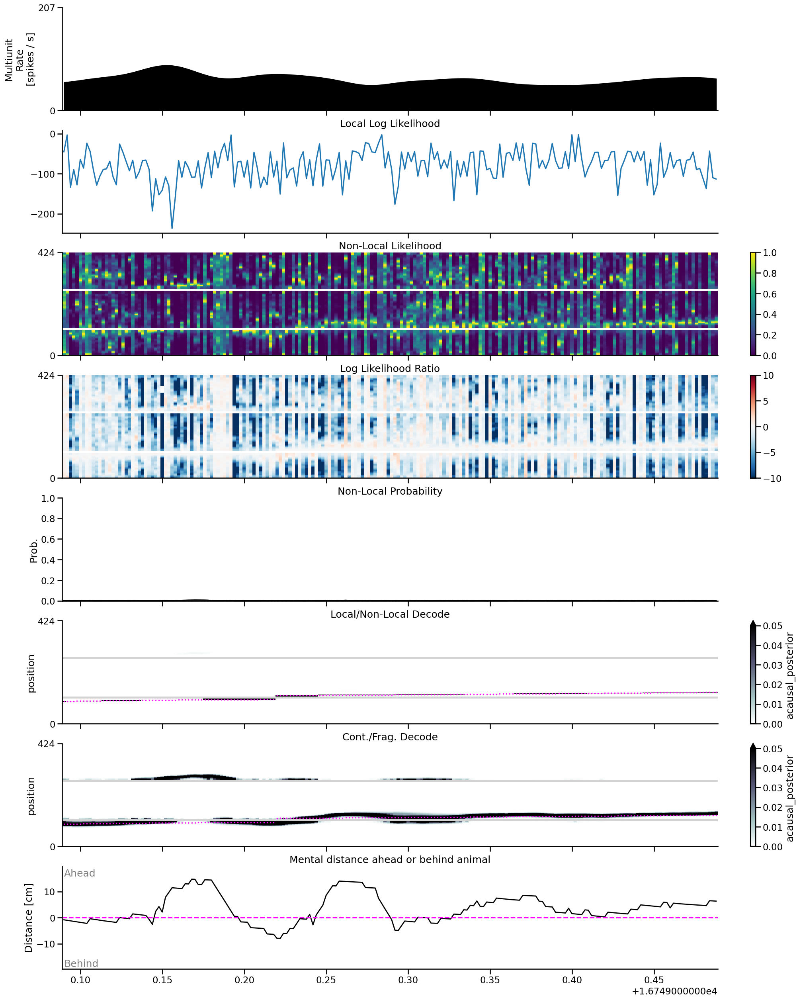

In [51]:
time_slice = slice(190_500, 190_700)

plot_detector_diagnostics(
    time_slice,
    non_local_results,
    non_local_multiunit_likelihood,
    scaled_non_local_multiunit_likelihood,
    data,
    classifier,
    classifier_results,
    figsize=(20, 25),
)

In [30]:
log_likelihood_ratio = non_local_multiunit_likelihood - local_multiunit_likelihood

In [ ]:
# local decode should get the same answer at the place bin center points

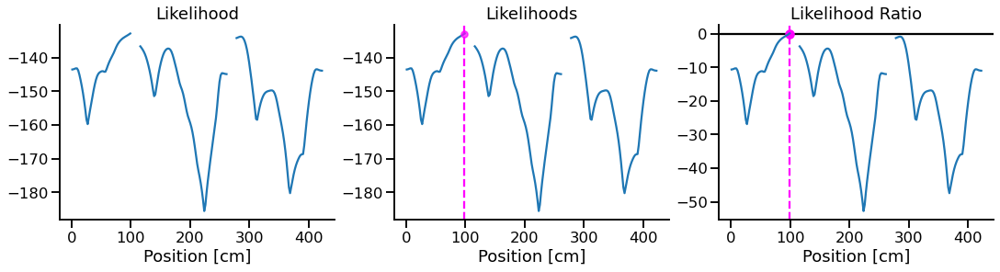

In [97]:
time_ind = 52

fig, axes = plt.subplots(1, 3, constrained_layout=True, figsize=(15, 4), sharex=True)
axes[0].plot(non_local_detector.place_bin_centers_, non_local_multiunit_likelihood[time_slice][time_ind])
axes[0].set_title('Likelihood')
axes[0].set_xlabel('Position [cm]')


axes[1].plot(non_local_detector.place_bin_centers_, non_local_multiunit_likelihood[time_slice][time_ind])
axes[1].scatter(data['position_info'].iloc[time_slice].linear_position[time_ind], local_multiunit_likelihood[time_slice][time_ind],
                color='magenta', s=50, zorder=10, alpha=0.7)
axes[1].axvline(data['position_info'].iloc[time_slice].linear_position[time_ind], color='magenta', zorder=-1, linestyle='--')
axes[1].set_title('Likelihoods')
axes[1].set_xlabel('Position [cm]')

axes[2].scatter(data['position_info'].iloc[time_slice].linear_position[time_ind], 0.0,
            color='magenta')
axes[2].axvline(data['position_info'].iloc[time_slice].linear_position[time_ind], color='magenta', zorder=-1, linestyle='--')

ll_ratio = non_local_multiunit_likelihood[time_slice][time_ind] - local_multiunit_likelihood[time_slice][time_ind]
axes[2].plot(non_local_detector.place_bin_centers_, ll_ratio)
axes[2].axhline(0, color='black', zorder=-2)
axes[2].set_title('Likelihood Ratio')
axes[2].set_xlabel('Position [cm]')
sns.despine()

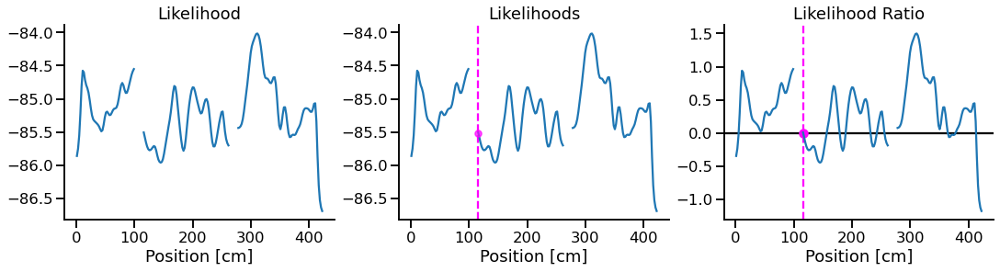

In [105]:
time_ind = 70

fig, axes = plt.subplots(1, 3, constrained_layout=True, figsize=(15, 4), sharex=True)
axes[0].plot(non_local_detector.place_bin_centers_, non_local_multiunit_likelihood[time_slice][time_ind])
axes[0].set_title('Likelihood')
axes[0].set_xlabel('Position [cm]')


axes[1].plot(non_local_detector.place_bin_centers_, non_local_multiunit_likelihood[time_slice][time_ind])
axes[1].scatter(data['position_info'].iloc[time_slice].linear_position[time_ind], local_multiunit_likelihood[time_slice][time_ind],
                color='magenta', s=50, zorder=10, alpha=0.7)
axes[1].axvline(data['position_info'].iloc[time_slice].linear_position[time_ind], color='magenta', zorder=-1, linestyle='--')
axes[1].set_title('Likelihoods')
axes[1].set_xlabel('Position [cm]')

axes[2].scatter(data['position_info'].iloc[time_slice].linear_position[time_ind], 0.0,
            color='magenta')
axes[2].axvline(data['position_info'].iloc[time_slice].linear_position[time_ind], color='magenta', zorder=-1, linestyle='--')

ll_ratio = non_local_multiunit_likelihood[time_slice][time_ind] - local_multiunit_likelihood[time_slice][time_ind]
axes[2].plot(non_local_detector.place_bin_centers_, ll_ratio)
axes[2].axhline(0, color='black', zorder=-2)
axes[2].set_title('Likelihood Ratio')
axes[2].set_xlabel('Position [cm]')
sns.despine()

# TODO #
+ figure out why there are -inf in the likelihood

In [108]:
from src.load_data import get_descending_theta

gnd_lfp, theta_filtered_lfp, is_descending = get_descending_theta(data['tetrode_info'], data['position_info'])